In [ ]:
#Import common libs
import pandas as pd
from pandas import DataFrame
import numpy as np
from numpy import asarray as arr
import matplotlib.pyplot as plt
import random ,os
import scipy.stats as stats
from sklearn.metrics import mean_squared_error
import math

# Import seaborn for plots
!pip install seaborn
import seaborn as sns

# Import Statsmodels
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.stattools import acf
from statsmodels.stats.stattools import durbin_watson

%matplotlib inline

#random seed
def seed_everything(seed=666):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
seed_everything()

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
#get the data
f = pd.read_csv("/content/elec_devices_all.csv")
f = f.sort_values(by =['year',"month"]) 

In [ ]:
#melt the data
lis_true =[8418, 8450, 8516, 8421, 8422, 8528, 8531, 8508, 8509, 8414, 8415]
lis_income = [[],[],[],[],[],[],[],[],[],[],[]]
lis_outcome = [[],[],[],[],[],[],[],[],[],[],[]]
#1995 to 2019
for year in range(25):
  for month in range(12):
    for i in range(len(lis_true)):
      df_income  = f.loc[(f['product_code'] == lis_true[i]) & (f['year'] == year+1995) & (f['month'] == month+1) & (f['income_outcome'] == 1)]
      df_outcome = f.loc[(f['product_code'] == lis_true[i]) & (f['year'] == year+1995) & (f['month'] == month+1) & (f['income_outcome'] == 0)]

      if df_income.empty:
        lis_income[i].append(0)
      else:  
        lis_income[i].append(df_income.values[0][3])

      if df_outcome.empty:
        lis_outcome[i].append(0) 
      else:  
        lis_outcome[i].append(df_outcome.values[0][3])    


In [ ]:
#create melt data
df = pd.DataFrame(list(zip(lis_income[0], lis_income[1], lis_income[2], lis_income[3], lis_income[4], lis_income[5], lis_income[6], lis_income[7], lis_income[8], lis_income[9], lis_income[10],
                           lis_outcome[0], lis_outcome[1], lis_outcome[2], lis_outcome[3], lis_outcome[4], lis_outcome[5], lis_outcome[6], lis_outcome[7], lis_outcome[8], lis_outcome[9], lis_outcome[10])), 
               columns =["8418_in", "8450_in", "8516_in", "8421_in", "8422_in", "8528_in", "8531_in", "8508_in", "8509_in", "8414_in", "8415_in",
                         "8418_out", "8450_out", "8516_out", "8421_out", "8422_out", "8528_out", "8531_out", "8508_out", "8509_out", "8414_out", "8415_out"])  

In [ ]:
df = df.iloc[:-1]
df#view melt data

,8418_in,8450_in,8516_in,8421_in,8422_in,8528_in,8531_in,8508_in,8509_in,8414_in,8415_in,8418_out,8450_out,8516_out,8421_out,8422_out,8528_out,8531_out,8508_out,8509_out,8414_out,8415_out
0,7661309,4745324,3780457,6001693,2326816,25197722,1001096,4382011,2240505,17424795,1394220,676126,0,16273,79825,0,2993,0,0,0,0,0
1,5086199,1763006,2910637,18665839,7046538,17859756,74064,2311828,1469801,13711283,1920684,439134,0,36073,0,0,673878,0,0,1695,1915,0
2,7600046,4867424,3107025,12374708,3722594,21573435,2172283,1467106,1265008,21107593,3770276,123458,0,1017,13600,0,0,0,0,0,6780,47460
3,12239033,2966894,4516713,6179629,2091853,8810670,2063463,1447155,3360221,16197823,3566334,3021,0,98649,27700,0,0,2992,2500,6102,0,104755
4,7610380,2275769,3461703,6905674,4920692,32305751,998174,1151096,1959875,37758204,1999369,573780,0,44382,0,0,0,0,1020,0,1190,12000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,474159015,191703145,124692676,455106566,394476390,232851574,33896488,23585366,110918663,532290049,198397957,49347796,32454938,194006143,1160117,4043299,1210895974,0,0,1201818,1401217,65876301
295,436405980,165984139,118857511,276349341,147795627,287212434,35976544,22384864,70291995,313604782,196098001,24529404,40254382,151530440,2253330,739681,1304732729,0,0,569097,1526667,20755897
296,453457777,183964376,127725317,476629592,241570025,172339389,36879075,15490518,83801910,376073775,135632606,40708892,51767946,190077054,1510919,249592,1578364823,0,0,2843273,4463488,17705898
297,396226755,209265685,132923820,430728801,196859314,182279242,47374318,23144664,86816956,341601676,167470971,24787789,45644487,183832530,3227437,1029247,1460462081,0,0,2049202,2171420,55985884


In [ ]:
df.to_csv("elec_devices_all_melt.csv", index=False)#save melt data

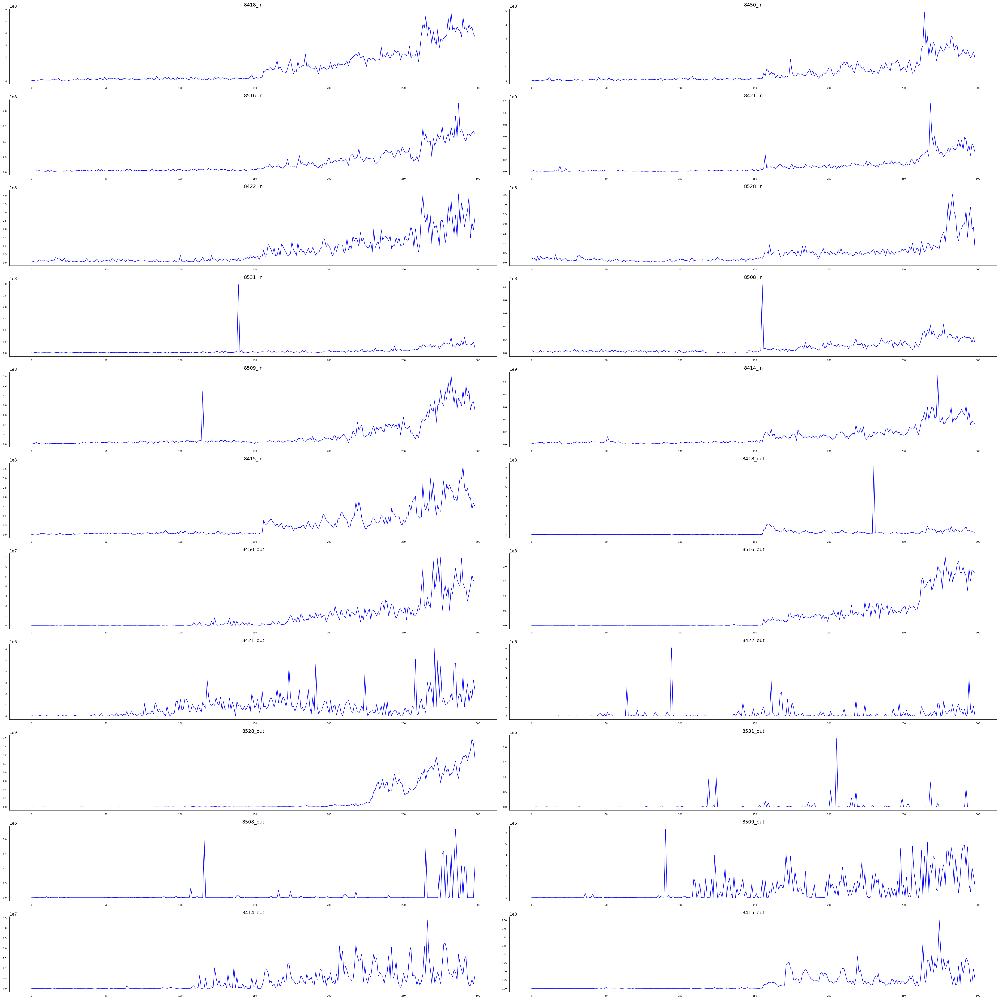

In [ ]:
#plot series 
fig, axes = plt.subplots(nrows=11, ncols=2, dpi=150, figsize=(35,35))
for i, ax in enumerate(axes.flatten()):
    data = df[df.columns[i]]
    ax.plot(data, color='blue', linewidth=1)
    # Decorations
    ax.set_title(df.columns[i])
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout();

In [ ]:
#grangers_causation_matrix
maxlag=12
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

grangers_causation_matrix(df, variables = df.columns)   

,8418_in_x,8450_in_x,8516_in_x,8421_in_x,8422_in_x,8528_in_x,8531_in_x,8508_in_x,8509_in_x,8414_in_x,8415_in_x,8418_out_x,8450_out_x,8516_out_x,8421_out_x,8422_out_x,8528_out_x,8531_out_x,8508_out_x,8509_out_x,8414_out_x,8415_out_x
8418_in_y,1.0000,0.0000,0.0001,0.0000,0.0000,0.0021,0.2694,0.0035,0.0076,0.0000,0.0000,0.0704,0.0000,0.0000,0.0000,0.4980,0.0000,0.5471,0.0002,0.0034,0.0098,0.0003
8450_in_y,0.0000,1.0000,0.0000,0.0000,0.0000,0.0001,0.0518,0.0000,0.0001,0.0000,0.0000,0.6136,0.0000,0.0000,0.0124,0.1528,0.0000,0.5771,0.0113,0.0012,0.0202,0.0000
8516_in_y,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0965,0.0007,0.0000,0.0000,0.0000,0.1426,0.0000,0.0000,0.0000,0.3941,0.0000,0.4601,0.0000,0.0000,0.0000,0.0000
8421_in_y,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0195,0.0000,0.0000,0.0000,0.0000,0.3112,0.0000,0.0000,0.0006,0.4634,0.0000,0.1016,0.0000,0.0000,0.0000,0.0000
8422_in_y,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0260,0.0000,0.0000,0.0000,0.0000,0.0408,0.0000,0.0000,0.0000,0.2769,0.0000,0.2744,0.0000,0.0007,0.0009,0.0000
8528_in_y,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0068,0.0001,0.0000,0.0000,0.0000,0.5568,0.0000,0.0000,0.0000,0.1952,0.0000,0.1310,0.0000,0.0002,0.0002,0.0000
8531_in_y,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0192,0.0000,0.0000,0.0001,0.2025,0.0000,0.9624,0.0030,0.0000,0.0000,0.0000
8508_in_y,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0068,1.0000,0.0000,0.0000,0.0000,0.1054,0.0000,0.0000,0.0489,0.7780,0.0000,0.7683,0.0074,0.0046,0.0004,0.0000
8509_in_y,0.0000,0.0000,0.0000,0.0000,0.0000,0.0002,0.0063,0.0000,1.0000,0.0000,0.0000,0.4217,0.0000,0.0000,0.0010,0.7637,0.0000,0.5898,0.0000,0.0092,0.0001,0.0000
8414_in_y,0.0000,0.0000,0.0000,0.0000,0.0000,0.0001,0.0356,0.0000,0.0000,1.0000,0.0000,0.5997,0.0000,0.0000,0.0000,0.0966,0.0000,0.0055,0.0000,0.0015,0.0000,0.0000


In [ ]:
#Johanson's Cointegration Test
def cointegration_test(df, alpha=0.05): 
    """Perform Johanson's Cointegration Test and Report Summary"""
    out = coint_johansen(df,-1,5)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

cointegration_test(df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
8418_in ::  2436.5    > nan       =>   False
8450_in ::  2109.79   > nan       =>   False
8516_in ::  1819.85   > nan       =>   False
8421_in ::  1542.39   > nan       =>   False
8422_in ::  1298.65   > nan       =>   False
8528_in ::  1095.08   > nan       =>   False
8531_in ::  918.6     > nan       =>   False
8508_in ::  765.74    > nan       =>   False
8509_in ::  627.46    > nan       =>   False
8414_in ::  512.94    > nan       =>   False
8415_in ::  428.36    > 311.1288  =>   True
8418_out ::  348.75    > 263.2603  =>   True
8450_out ::  280.1     > 219.4051  =>   True
8516_out ::  224.0     > 179.5199  =>   True
8421_out ::  171.23    > 143.6691  =>   True
8422_out ::  128.79    > 111.7797  =>   True
8528_out ::  93.27     > 83.9383   =>   True
8531_out ::  61.48     > 60.0627   =>   True
8508_out ::  35.35     > 40.1749   =>   False
8509_out ::  17.21     > 24.2761   =>   False
8414_out :

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/vector_ar/vecm.py:608: HypothesisTestWarning: Critical values are only available for time series with 12 variables at most.
  category=HypothesisTestWarning)


In [ ]:
#split
df_train, df_test = df[0:int(299*0.75)], df[int(299*0.75):]
print(df_train.shape) 
print(df_test.shape) 

(224, 22)
(75, 22)


In [ ]:
#adfuller_test for Stationarity
def adfuller_test(series, signif=0.05, name='', verbose=False):
    """Perform ADFuller to test for Stationarity of given series and print report"""
    r = adfuller(series, autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print(f'    Augmented Dickey-Fuller Test on "{name}"', "\n   ", '-'*47)
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
        
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")  

In [ ]:
for name, column in df_train.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')


    Augmented Dickey-Fuller Test on "8418_in" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 0.8096
 No. Lags Chosen       = 4
 Critical value 1%     = -3.461
 Critical value 5%     = -2.875
 Critical value 10%    = -2.574
 => P-Value = 0.9918. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "8450_in" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 0.9725
 No. Lags Chosen       = 11
 Critical value 1%     = -3.462
 Critical value 5%     = -2.875
 Critical value 10%    = -2.574
 => P-Value = 0.994. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "8516_in" 
    -----------------------------------------------
 Null Hypothesis: Data has 

In [ ]:
# 1st difference to make data Stationarity
df_differenced = df_train.diff().dropna()

In [ ]:
# ADF Test on each column of 1st Differences Dataframe
for name, column in df_differenced.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "8418_in" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -12.1298
 No. Lags Chosen       = 3
 Critical value 1%     = -3.461
 Critical value 5%     = -2.875
 Critical value 10%    = -2.574
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "8450_in" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -7.9164
 No. Lags Chosen       = 9
 Critical value 1%     = -3.461
 Critical value 5%     = -2.875
 Critical value 10%    = -2.574
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "8516_in" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level 

In [ ]:
# Second Differencing
df_differenced = df_differenced.diff().dropna()

In [ ]:
# ADF Test on each column of 2nd Differences Dataframe
for name, column in df_differenced.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "8418_in" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.6216
 No. Lags Chosen       = 15
 Critical value 1%     = -3.462
 Critical value 5%     = -2.876
 Critical value 10%    = -2.574
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "8450_in" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -8.4554
 No. Lags Chosen       = 14
 Critical value 1%     = -3.462
 Critical value 5%     = -2.876
 Critical value 10%    = -2.574
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "8516_in" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level

In [ ]:
#too slow brute force
for i in [1,2,3,4,5,6,7,8]:
    model = VARMAX(df_differenced, order=(i,0), trend='nc')
    result = model.fit(disp=False)
    print('Order = ', i)
    print('AIC: ', result.aic)
    print('BIC: ', result.bic)
    print('HQIC: ', result.hqic)


In [ ]:
model = VARMAX(df_differenced, order=(2,0), trend='nc')

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:215: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


In [ ]:
#fit
model_fitted = model.fit(disp=False)
model_fitted.summary()

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Dep. Variable:,"['8418_in', '8450_in', '8516_in', '8421_in', '8422_in', '8528_in', '8531_in', '8508_in', '8509_in', '8414_in', '8415_in', '8418_out', '8450_out', '8516_out', '8421_out', '8422_out', '8528_out', '8531_out', '8508_out', '8509_out', '8414_out', '8415_out']",No. Observations:,222
Model:,VAR(2),Log Likelihood,-81350.672
Date:,"Sat, 12 Sep 2020",AIC,165143.344
Time:,14:08:42,BIC,169298.013
Sample:,0,HQIC,166820.741
,- 222,,
Covariance Type:,opg,,
Ljung-Box (Q):,"90.91, 96.29, 62.23, 64.21, 82.03, 116.10, 71.98, 52.79, 50.20, 56.41, 55.41, 103.88, 80.29, 70.38, 50.88, 85.81, 88.58, 53.37, 82.98, 76.68, 74.46, 73.53",Jarque-Bera (JB):,"182.59, 105.37, 116.33, 203.89, 78.24, 4.86, 18592.11, 21874.26, 18847.96, 29.27, 41.41, 320.02, 34.53, 193.58, 45.55, 5033.17, 29.66, 658.70, 2391.67, 1749.82, 61.91, 151.14"
Prob(Q):,"0.00, 0.00, 0.01, 0.01, 0.00, 0.00, 0.00, 0.08, 0.13, 0.04, 0.05, 0.00, 0.00, 0.00, 0.12, 0.00, 0.00, 0.08, 0.00, 0.00, 0.00, 0.00",Prob(JB):,"0.00, 0.00, 0.00, 0.00, 0.00, 0.09, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00"
Heteroskedasticity (H):,"6.00, 4.78, 7.30, 1.26, 6.88, 1.23, 6.35, 12.47, 4.04, 1.77, 8.38, 8.22, 10.60, 4.75, 6.77, 0.95, 12.82, 7.44, 1.37, 6.97, 7.82, 6.16",Skew:,"-0.46, -0.17, -0.17, -0.54, 0.63, -0.01, -2.13, 1.03, 0.26, 0.25, -0.04, -0.94, 0.14, -0.53, -0.26, -1.23, 0.01, 0.16, 0.03, 0.35, -0.05, -0.26"
Prob(H) (two-sided):,"0.00, 0.00, 0.00, 0.32, 0.00, 0.38, 0.00, 0.00, 0.00, 0.01, 0.00, 0.00, 0.00, 0.00, 0.00, 0.83, 0.00, 0.00, 0.17, 0.00, 0.00, 0.00",Kurtosis:,"7.35, 6.36, 6.53, 7.57, 5.62, 3.72, 47.63, 51.59, 48.14, 4.70, 5.11, 8.57, 4.91, 7.45, 5.16, 26.20, 4.79, 11.43, 19.08, 16.74, 5.58, 7.01"


/usr/local/lib/python3.6/dist-packages/statsmodels/graphics/utils.py:89: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/usr/local/lib/python3.6/dist-packages/statsmodels/graphics/utils.py:89: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


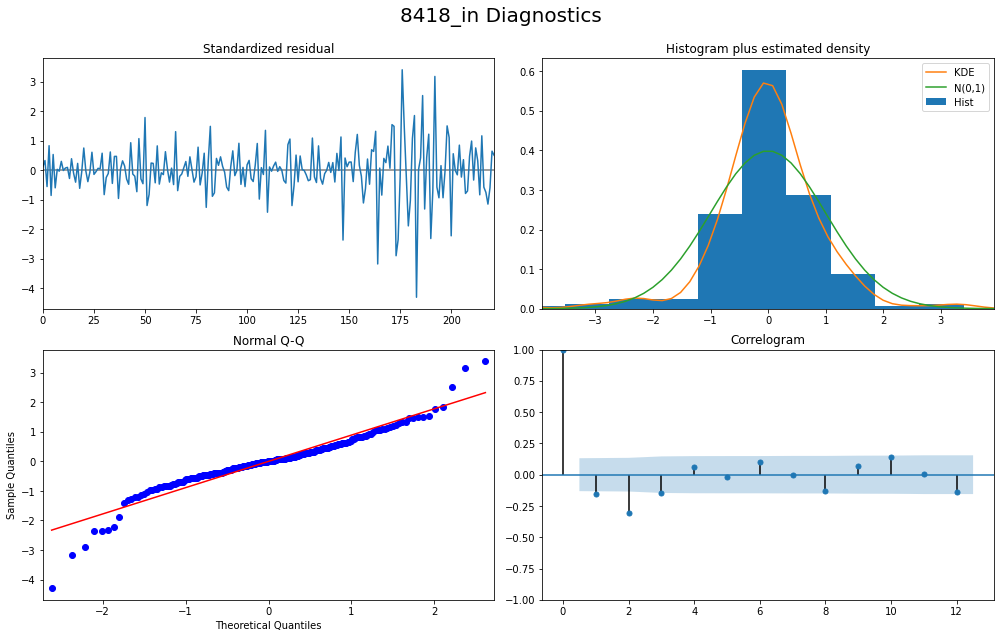

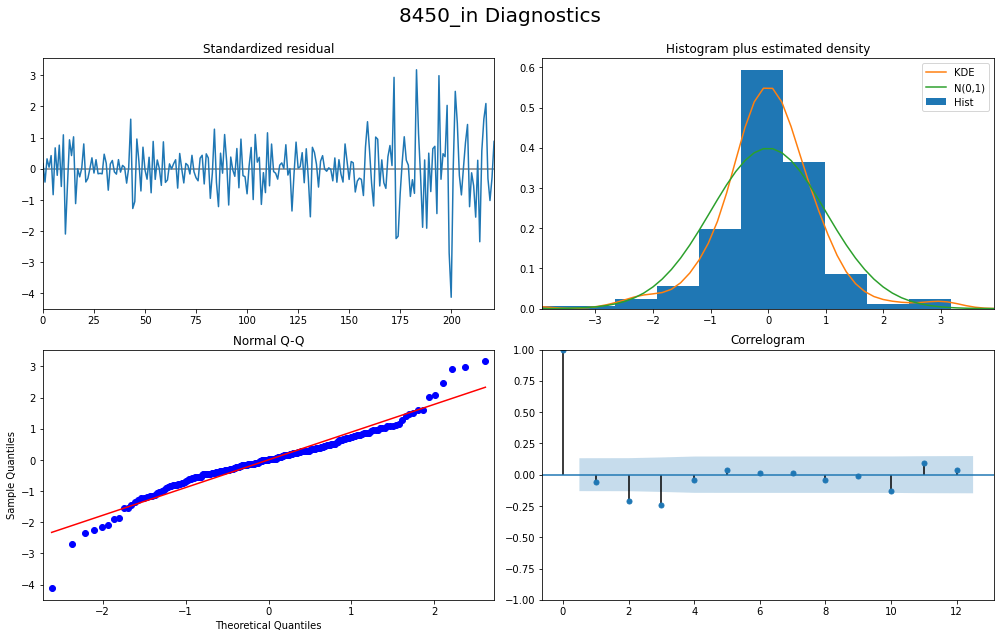

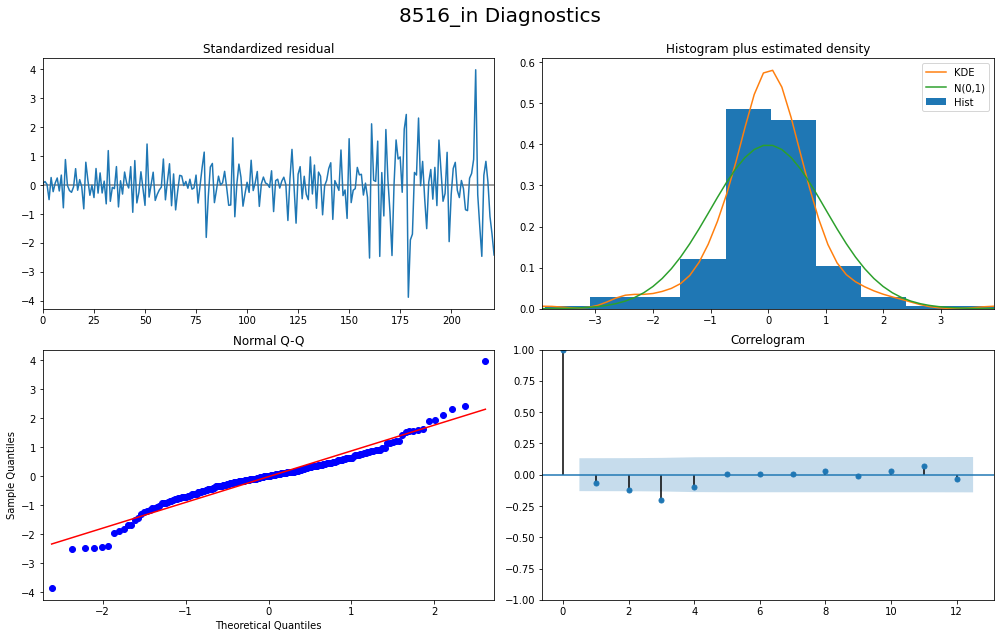

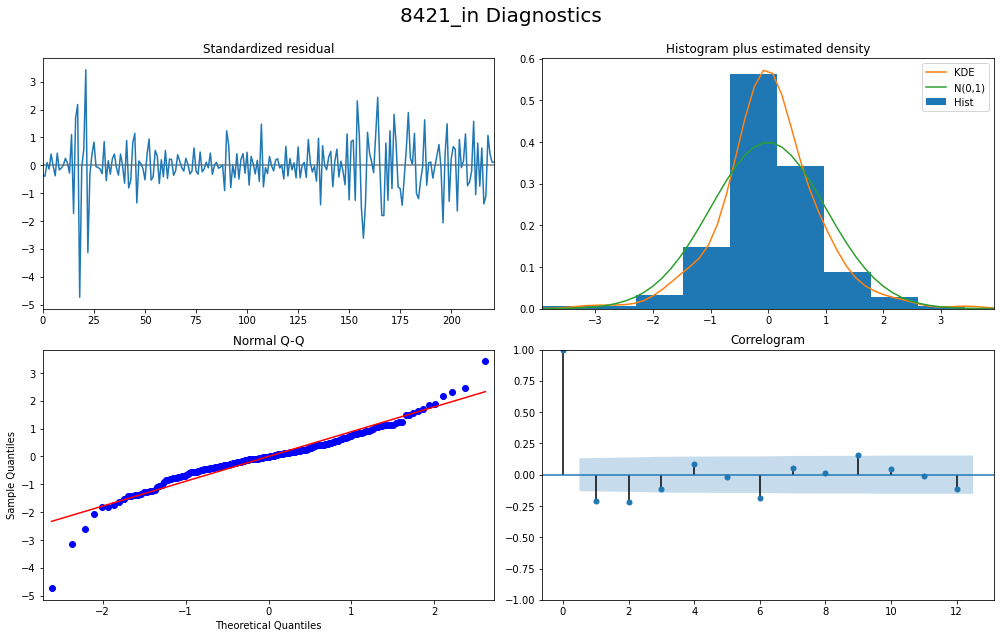

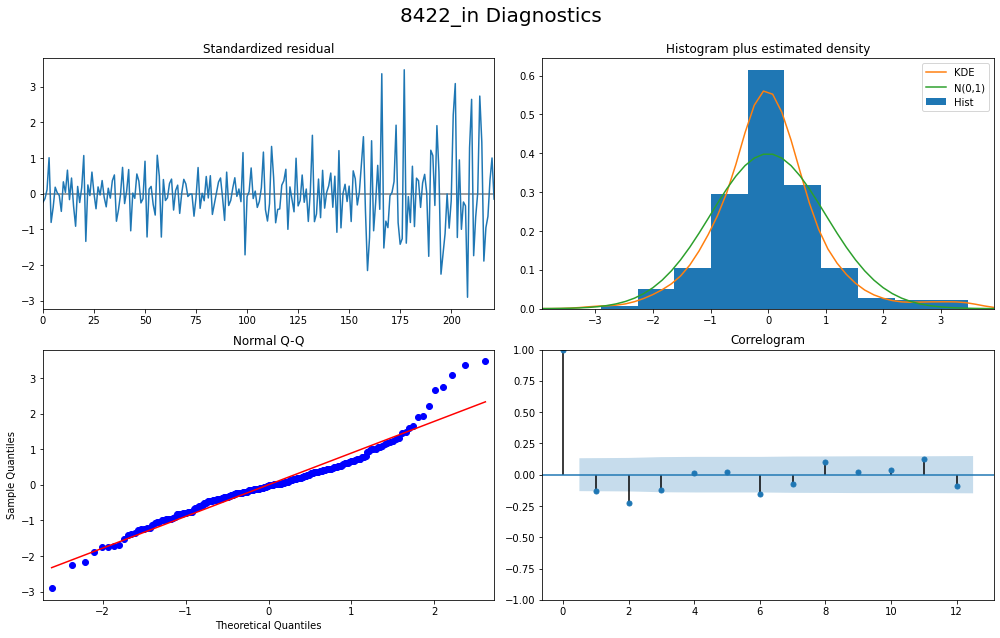

...

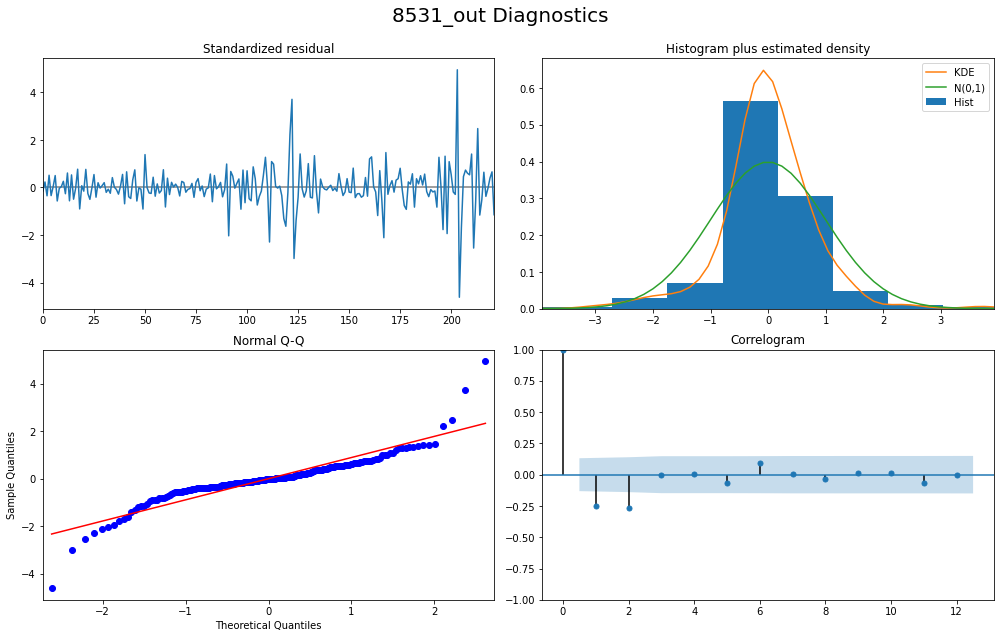

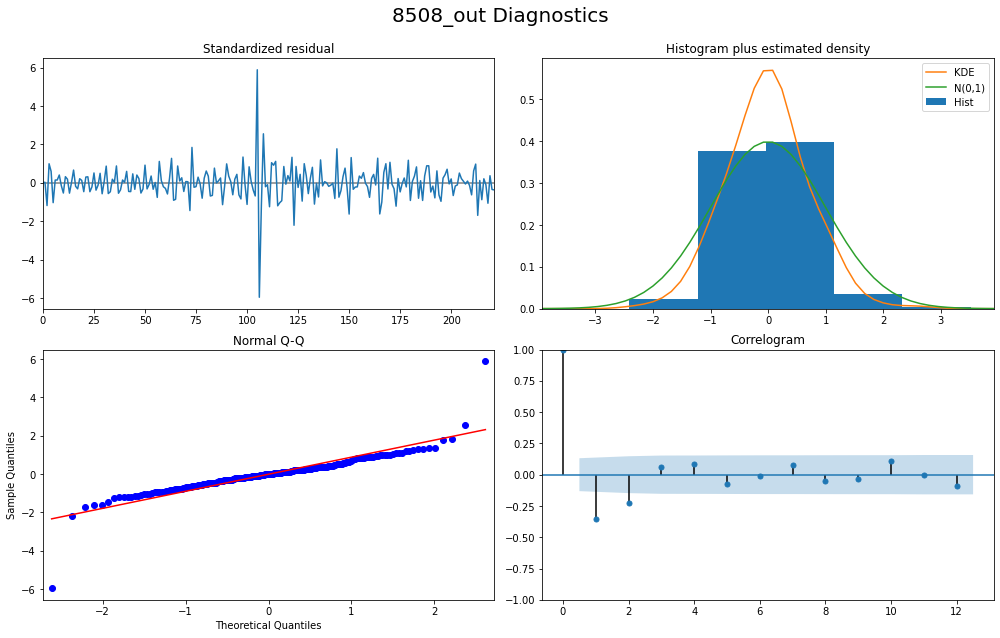

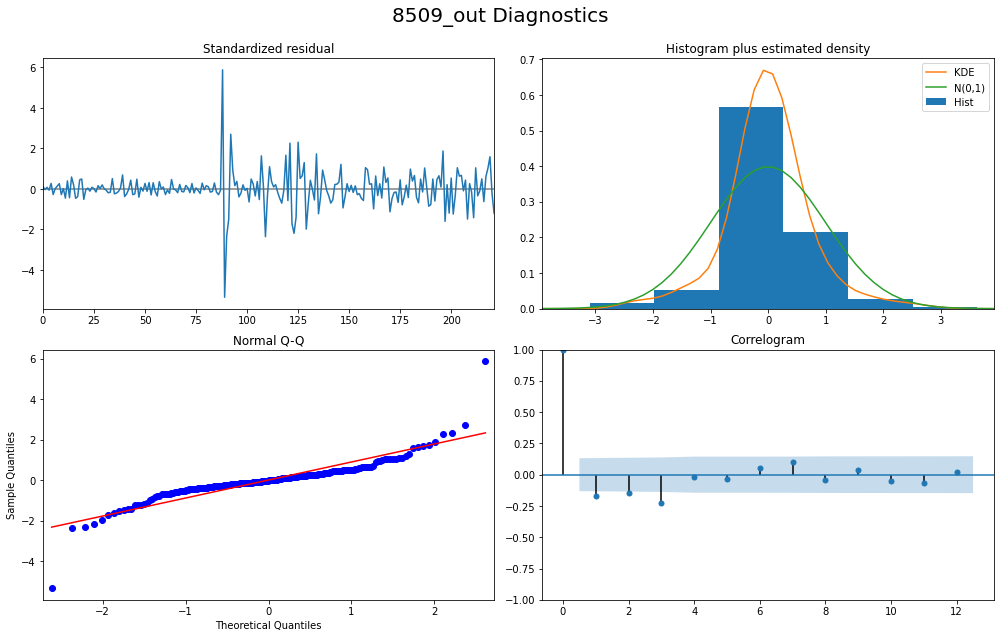

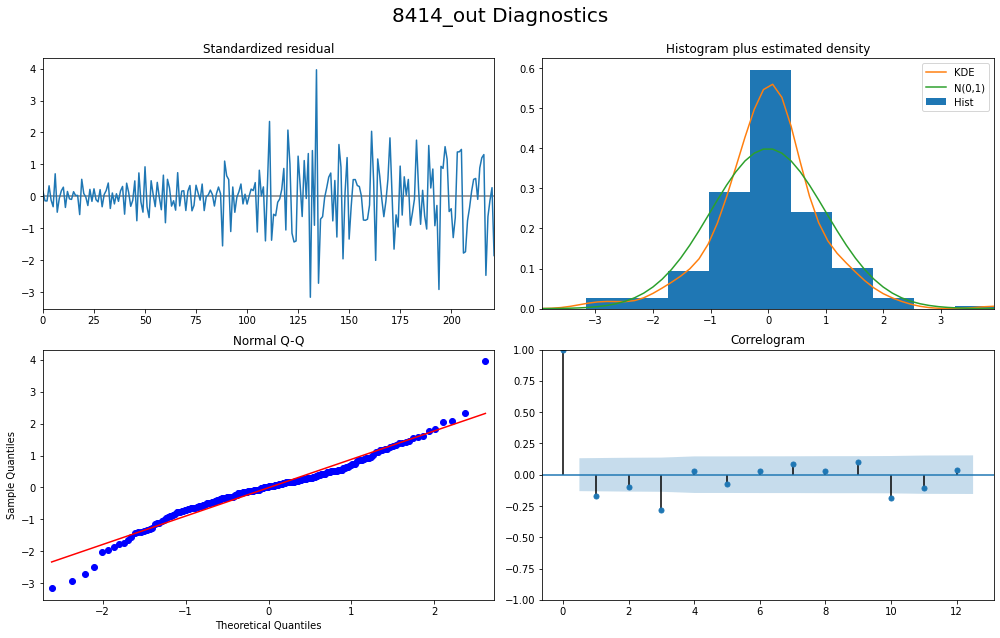

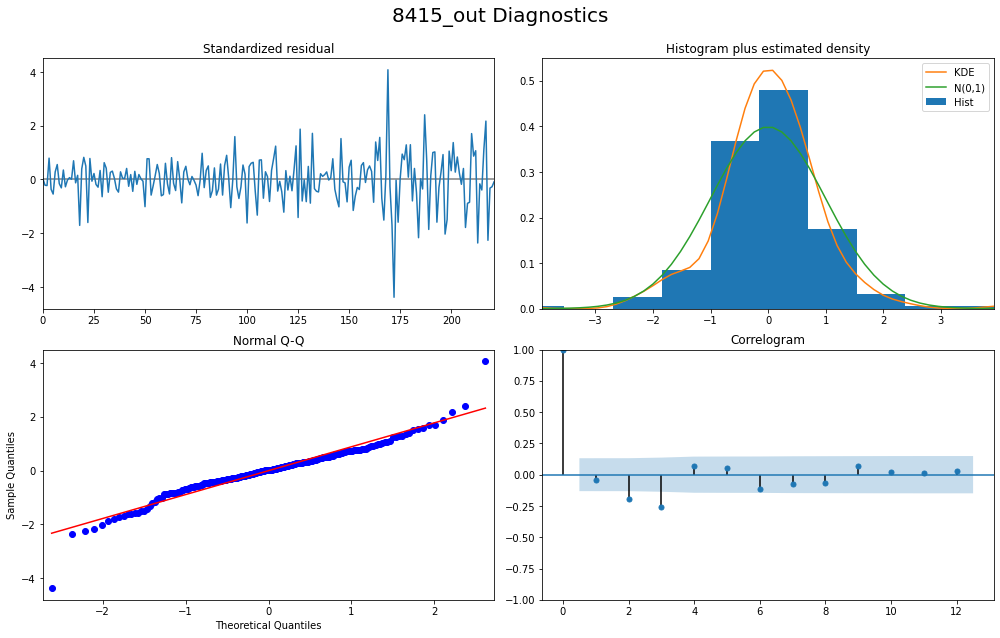

In [ ]:
#analysis for each series
li=df_train.columns
for i in range(22):
  model_fitted.plot_diagnostics(figsize=(14,9), lags=12,variable=i)
  plt.gcf().suptitle(li[i]+' Diagnostics', fontsize=20)
  plt.tight_layout()
  plt.subplots_adjust(top=.9);


In [ ]:
#simple test:The Durbin Watson (DW) statistic is a test for autocorrelation
def adjust(val, length= 6): return str(val).ljust(length)
out = durbin_watson(model_fitted.resid)

for col, val in zip(df.columns, out):
    print(adjust(col), ':', round(val, 2))

8418_in : 2.31
8450_in : 2.12
8516_in : 2.11
8421_in : 2.47
8422_in : 2.31
8528_in : 2.23
8531_in : 2.24
8508_in : 2.32
8509_in : 2.24
8414_in : 2.24
8415_in : 2.21
8418_out : 2.23
8450_out : 2.5
8516_out : 2.24
8421_out : 2.26
8422_out : 2.2
8528_out : 2.23
8531_out : 2.48
8508_out : 2.5
8509_out : 2.41
8414_out : 2.35
8415_out : 2.19


In [ ]:
#forecast
df_forecast=model_fitted.forecast(steps=75)
df_forecast.columns=df.columns + '_2d'
df_forecast

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


,8418_in_2d,8450_in_2d,8516_in_2d,8421_in_2d,8422_in_2d,8528_in_2d,8531_in_2d,8508_in_2d,8509_in_2d,8414_in_2d,8415_in_2d,8418_out_2d,8450_out_2d,8516_out_2d,8421_out_2d,8422_out_2d,8528_out_2d,8531_out_2d,8508_out_2d,8509_out_2d,8414_out_2d,8415_out_2d
222,-7.214865e+07,-3.863139e+07,-1.052562e+07,-2.263917e+07,-6.826540e+06,-1.683636e+07,2.145244e+07,1.778099e+07,4.379989e+07,-2.015710e+08,-6.827270e+07,-1.415214e+07,-6.583075e+05,-7.644370e+06,1.929427e+05,-1.374467e+06,-4.031842e+07,281660.046150,-374763.854242,5.714287e+06,1.705335e+07,-2.069694e+06
223,1.031068e+08,1.903181e+07,2.362581e+07,4.986057e+07,-5.652956e+06,2.297629e+07,2.503961e+07,-8.869276e+06,-4.128975e+07,1.884201e+08,6.796167e+07,7.079839e+06,7.501795e+06,1.617852e+07,1.216482e+06,2.562852e+06,4.039944e+07,-674474.263397,796690.333676,-5.427881e+06,-1.209777e+07,-1.166381e+07
224,-9.691565e+07,-1.067017e+07,-2.843132e+07,-4.093694e+07,-5.348507e+06,-3.477114e+07,-6.720859e+07,-3.392544e+06,2.018501e+07,-1.196235e+08,-5.120534e+07,-7.143904e+05,-7.142318e+06,-1.841096e+07,-1.804191e+06,-1.844875e+06,-3.062404e+07,811178.585016,-847794.855446,3.562046e+06,1.018398e+07,1.688290e+07
225,5.994656e+07,1.820472e+07,2.092969e+07,1.879692e+07,4.242747e+05,3.075583e+07,7.134729e+07,9.134579e+06,2.616057e+06,3.675910e+07,2.586326e+07,-2.596087e+06,5.917197e+06,1.782876e+07,1.270785e+06,6.021679e+04,1.430168e+07,-601404.793497,472017.876933,-8.465150e+05,-9.036410e+06,-1.356226e+07
226,-2.065607e+07,-2.103347e+07,-9.062803e+06,-3.841545e+06,1.975258e+07,-1.471165e+07,-5.116772e+07,-5.305447e+06,-1.164912e+07,2.151995e+07,-1.680016e+06,6.433673e+06,-4.954844e+06,-1.350707e+07,-5.514832e+05,1.357710e+06,4.114673e+05,283246.953446,-3980.803657,-1.414812e+06,6.617546e+06,7.705504e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,2.920385e+04,7.899097e+03,7.227039e+03,1.176230e+04,2.744108e+02,1.070186e+04,9.109889e+03,2.349798e+03,-1.562913e+03,3.219170e+04,1.489241e+04,4.430722e+03,1.227627e+03,3.693083e+03,3.620636e+02,2.121498e+02,5.003811e+03,-142.602393,86.652679,-5.188469e+02,-5.071278e+02,-5.016533e+03
293,-2.591866e+04,-6.078761e+03,-5.946614e+03,-1.340799e+04,7.298878e+03,-1.191458e+04,-5.471505e+03,-2.767693e+03,-2.133419e+03,-1.486303e+04,-7.880263e+03,-3.581766e+03,-2.195284e+03,-5.673882e+03,-4.228781e+02,1.421150e+02,-6.838905e+02,122.542088,-23.964228,-1.189390e+02,7.713182e+02,4.061837e+03
294,1.506566e+04,2.709905e+03,3.042900e+03,1.047599e+04,-1.100112e+04,9.081116e+03,8.441475e+02,2.196398e+03,4.359186e+03,-3.489066e+03,-1.838991e+02,1.768696e+03,2.261231e+03,5.443371e+03,3.357672e+02,-3.788619e+02,-2.964660e+03,-66.893027,-33.283145,5.852441e+02,-7.438928e+02,-2.015256e+03
295,-1.681360e+03,8.361434e+02,2.266490e+02,-4.805922e+03,1.043295e+04,-3.936581e+03,3.099041e+03,-1.030447e+03,-4.720578e+03,1.684866e+04,6.519756e+03,2.342926e+02,-1.595184e+03,-3.516476e+03,-1.607927e+02,4.443118e+02,4.921272e+03,1.514955,67.783707,-7.644286e+02,4.931389e+02,-2.539907e+02


In [ ]:
#inverce diffrence func
def invert_transformation(df_train, df_forecast, second_diff=False):
    """Revert back the differencing to get the forecast to original scale."""
    df_fc = df_forecast.copy()
    columns = df_train.columns
    for col in columns: 
        # Roll back 2nd Diff
        if second_diff:
            df_fc[str(col)+'_1d'] = (df_train[col].iloc[-1]-df_train[col].iloc[-2]) + df_fc[str(col)+'_2d'].cumsum()
        # Roll back 1st Diff
        df_fc[str(col)+'_forecast'] = df_train[col].iloc[-1] + df_fc[str(col)+'_1d'].cumsum()
    return df_fc


In [ ]:
#reuslts
df_results = invert_transformation(df_train, df_forecast, second_diff=True)      
df_results.loc[:,["8418_in_forecast",	"8450_in_forecast",	"8516_in_forecast","8421_in_forecast",	"8422_in_forecast",	"8528_in_forecast",	"8531_in_forecast",	"8508_in_forecast",	"8509_in_forecast",	"8414_in_forecast",	"8415_in_forecast",
                "8418_out_forecast",	"8450_out_forecast",	"8516_out_forecast",	"8421_out_forecast",	"8422_out_forecast",	"8528_out_forecast",	"8531_out_forecast",	"8508_out_forecast",	"8509_out_forecast",	"8414_out_forecast",	"8415_out_forecast"]]


,8418_in_forecast,8450_in_forecast,8516_in_forecast,8421_in_forecast,8422_in_forecast,8528_in_forecast,8531_in_forecast,8508_in_forecast,8509_in_forecast,8414_in_forecast,8415_in_forecast,8418_out_forecast,8450_out_forecast,8516_out_forecast,8421_out_forecast,8422_out_forecast,8528_out_forecast,8531_out_forecast,8508_out_forecast,8509_out_forecast,8414_out_forecast,8415_out_forecast
222,1.466684e+08,6.287552e+07,1.100539e+07,7.465080e+07,1.596512e+08,2.645538e+07,1.361180e+07,1.869719e+07,3.836442e+07,1.802197e+08,-2.817693e+07,4.480236e+06,-4.071545e+05,1.659857e+07,2.476417e+05,-1.402516e+06,4.656046e+07,3.847380e+05,-3.747639e+05,3.948220e+06,6.118358e+06,-8.407181e+06
223,1.867005e+08,4.972958e+07,1.193150e+07,9.280252e+07,1.682532e+08,3.481189e+07,4.650704e+07,2.050199e+07,1.854897e+07,2.652095e+08,-5.022424e+07,-3.281916e+06,1.277742e+06,1.889316e+07,1.222447e+06,-2.421803e+05,7.028710e+07,4.346283e+04,4.716263e+04,1.672249e+06,-3.084182e+06,-4.201070e+07
224,1.298168e+08,2.591346e+07,-1.557370e+07,7.001731e+07,1.715067e+08,8.397269e+06,1.219368e+07,1.891425e+07,1.891852e+07,2.305758e+08,-1.234769e+08,-1.175846e+07,-4.179680e+06,2.776789e+06,3.930609e+05,-9.267196e+05,6.338971e+07,5.133662e+05,-3.787058e+05,2.958324e+06,-2.102739e+06,-5.873132e+07
225,1.328798e+08,2.030205e+07,-2.214922e+07,6.602901e+07,1.751845e+08,1.273847e+07,4.922762e+07,2.646108e+07,2.190413e+07,2.327012e+08,-1.708663e+08,-2.283109e+07,-3.719904e+06,4.489181e+06,8.344598e+05,-1.551042e+06,7.079399e+07,3.818648e+05,-3.325562e+05,3.397883e+06,-1.015771e+07,-8.901420e+07
226,1.152866e+08,-6.342820e+06,-3.778754e+07,5.819917e+07,1.986149e+08,2.368024e+06,3.509384e+07,2.870247e+07,1.324062e+07,2.563465e+08,-2.199357e+08,-2.747004e+07,-8.214973e+06,-7.305498e+06,7.243756e+05,-8.176543e+05,7.860974e+07,5.336103e+05,-2.903876e+05,2.422631e+06,-1.159513e+07,-1.115916e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,-9.261952e+08,-1.146994e+09,-9.565976e+08,-4.755255e+08,7.114021e+08,-4.979762e+08,3.688575e+08,2.137722e+08,-1.703608e+08,4.174234e+08,-3.753376e+09,-6.215430e+08,-1.605150e+08,-4.500831e+08,1.875848e+06,-1.308236e+07,3.782844e+08,5.928629e+06,-4.002136e+06,1.283197e+07,-2.738420e+08,-1.750587e+09
293,-9.419495e+08,-1.164320e+09,-9.705179e+08,-4.836103e+08,7.193257e+08,-5.055532e+08,3.738183e+08,2.165913e+08,-1.731741e+08,4.200681e+08,-3.806850e+09,-6.305042e+08,-1.628366e+08,-4.568156e+08,1.892890e+06,-1.326059e+07,3.828661e+08,6.010603e+06,-4.057230e+06,1.297960e+07,-2.778024e+08,-1.775414e+09
294,-9.576888e+08,-1.181644e+09,-9.844351e+08,-4.916846e+08,7.272383e+08,-5.131211e+08,3.787799e+08,2.194126e+08,-1.759830e+08,4.227093e+08,-3.860325e+09,-6.394637e+08,-1.651559e+08,-4.635428e+08,1.910267e+06,-1.343920e+07,3.874448e+08,6.092510e+06,-4.112357e+06,1.312781e+07,-2.817636e+08,-1.800243e+09
295,-9.734297e+08,-1.198967e+09,-9.983521e+08,-4.997637e+08,7.351614e+08,-5.206929e+08,3.837446e+08,2.222328e+08,-1.787966e+08,4.253673e+08,-3.913793e+09,-6.484229e+08,-1.674768e+08,-4.702734e+08,1.927484e+06,-1.361737e+07,3.920285e+08,6.174418e+06,-4.167416e+06,1.327526e+07,-2.857242e+08,-1.825073e+09


In [ ]:
#RELU
df_results[df_results < 0] = 0

In [ ]:
#evaluation
test=[]
res=[]
for i in df_test.columns:
  test.extend(list(df_test[i].values))
  res.extend(list(df_results[i+"_forecast"].values))
math.sqrt(mean_squared_error(test, res))#(order 2,0,0)

186331767.32965556

In [ ]:
#pred vs true
fig, axes = plt.subplots(nrows=int(len(df.columns)/2), ncols=2, dpi=250, figsize=(50,50))
for i, (col,ax) in enumerate(zip(df.columns, axes.flatten())):
    df_results[col+'_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    df_test[col].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout();

In [ ]:
#test or evaluation func
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    mse = np.mean((forecast - actual)**2)       # MSE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe,'mse':mse, 'rmse':rmse, 'corr':corr, 'minmax':minmax})


In [ ]:
#evaluation
lis_true =[8418, 8450, 8516, 8421, 8422, 8528, 8531, 8508, 8509, 8414, 8415]
for i in lis_true:
  print('Forecast Accuracy of: '+str(i)+"_in")
  accuracy_prod = forecast_accuracy(df_results[str(i)+'_in_forecast'].values, df_test[str(i)+'_in'])
  for k, v in accuracy_prod.items():
      print(adjust(k), ': ', round(v,4))
sum=[]     
for i in lis_true:
  print('Forecast Accuracy of: '+str(i)+"_out")
  accuracy_prod = forecast_accuracy(df_results[str(i)+'_out_forecast'].values, df_test[str(i)+'_out'])
  for k, v in accuracy_prod.items():
      print(adjust(k), ': ', round(v,4))
      sum.append(accuracy_prod["mse"])
      
np.mean(sum)

Forecast Accuracy of: 8418_in
mape   :  0.8685
me     :  -286682390.7656
mae    :  288499681.1794
mpe    :  -0.8538
mse    :  1.0495474233126406e+17
rmse   :  323967193.2947
corr   :  -0.5618
minmax :  0.8659
Forecast Accuracy of: 8450_in
mape   :  0.9146
me     :  -156278459.8544
mae    :  156669229.9713
mpe    :  -0.9088
mse    :  3.287022858394512e+16
rmse   :  181301485.333
corr   :  -0.3923
minmax :  0.9143
Forecast Accuracy of: 8516_in
mape   :  0.9879
me     :  -85516036.5222
mae    :  85516036.5222
mpe    :  -0.9879
mse    :  8929567496432428.0
rmse   :  94496388.801
corr   :  -0.1794
minmax :  0.9879
Forecast Accuracy of: 8421_in
mape   :  0.861
me     :  166291317.7055
mae    :  191015535.5827
mpe    :  0.8284
mse    :  4.815724671459523e+16
rmse   :  219447594.4607
corr   :  0.6922
minmax :  0.424
Forecast Accuracy of: 8422_in
mape   :  0.9225
me     :  -178578749.8242
mae    :  179191490.8274
mpe    :  -0.9161
mse    :  4.129671846801983e+16
rmse   :  203215940.487
corr   :

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered i

4.220052824768254e+16